# 2021년 05~07월 참여자 서베이 데이터 분석

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
pd.options.display.float_format = '{:,.2f}'.format
dfc = pd.read_csv("data/HeartBe_2107.csv")
dfc.columns = ['time', 'PICUA_1', 'PICUA_2', 'name', 'birth', 'phone_number', 'email', 'address', 'height', 'weight', 'body_shape', 'upper_body_size', 'lower_body_size', 'phone_model', 'PPA', 'last_mens_start', 'mens_cycle', 'mens_period', 'mens_regularity', 'mens_cramp', 'endo', 'peacetime_stress', 'diet_status', 'water_intake', 'coffee_intake', 'sitting_hours', 'walking_hours', 'rest_hours', 'sleep_hours', 'smoking_ongoing', 'smoking_experience', 'secondhand_smoke', 'drinking', 'exercise_frequency', 'exercise_type', 'thyroid', 'thyroid_pills', 'endo_operation', 'ob_gyn', 'pms', 'mens_blood_amount', 'mens_blood_color', 'mens_blood_clusters', 'menarche_age', 'mens_cramp_peak', 'mens_cramp_peak_stress', 'mens_cramp_part', 'mens_cramp_symptoms', 'pregnancy_experience', 'abortion_experience', 'childbirth_experience', 'number_of_births', 'mens_cramps_intensity', 'mens_cramps_checkup', 'ob.gyn_regular_checkup', 'mens_cramps_absent', 'ultrasound', 'mens_cramps_family', 'mens_blood_amount_phases', 'mens_pad_number', 'mens_symptoms', 'mens_before_after_pattern']
dfc.drop(['time'],axis=1)
dfc = dfc[['email', 'height', 'weight', 'body_shape', 'upper_body_size', 'lower_body_size', 'mens_cycle', 'mens_period', 'mens_regularity', 'mens_cramp', 'endo', 'peacetime_stress', 'diet_status', 'water_intake', 'coffee_intake', 'sitting_hours', 'walking_hours', 'rest_hours', 'sleep_hours', 'smoking_ongoing', 'smoking_experience', 'secondhand_smoke', 'drinking', 'exercise_type', 'thyroid', 'thyroid_pills', 'endo_operation', 'ob_gyn', 'pms', 'mens_blood_amount', 'mens_blood_color', 'mens_blood_clusters', 'menarche_age', 'mens_cramp_peak', 'mens_cramp_peak_stress', 'mens_cramp_part', 'mens_cramp_symptoms', 'pregnancy_experience', 'abortion_experience', 'childbirth_experience', 'number_of_births', 'mens_cramps_intensity', 'mens_cramps_checkup', 'ob.gyn_regular_checkup', 'mens_cramps_absent', 'mens_cramps_family', 'mens_blood_amount_phases', 'mens_pad_number', 'mens_symptoms', 'mens_before_after_pattern', 'name', 'birth', 'phone_number', 'phone_model', 'address', 'last_mens_start', 'exercise_frequency', 'ultrasound', 'PICUA_1', 'PICUA_2', 'PPA']]
dfc['phone_number'] = dfc['phone_number'].str.replace(pat=r'[^\w]', repl=r'', regex=True)
dfc['phone_number'] = dfc['phone_number'].str.lstrip('0')
dfc = dfc.replace({'PICUA_1' : '동의', 'PICUA_2' : '동의', 'PPA' : '예'}, 1)
dfc = dfc.replace({'PPA' : '아니오'}, 0)
dfc['height'] = dfc['height'].str.strip()
dfc['height'] = dfc['height'].str.replace(pat=r'[a-zA-Z]+', repl= r'', regex=True)
dfc['height'] = dfc['height'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['height'] = dfc['height'].str.rstrip("'")
dfc['weight'] = dfc['weight'].str.replace(pat=r'[a-zA-Z]+', repl= r'', regex=True)
dfc['weight'] = dfc['weight'].str.rstrip("'")
dfc['height'] = dfc['height'].str.strip()
pd.set_option('display.max_rows', 400)
pd.set_option('display.max_columns', 400)
dfc['body_shape'] = dfc['body_shape'].str.replace(pat=r'[^\w]', repl=r'', regex=True)
dfc['body_shape'] = dfc['body_shape'].str.strip("'")
dfc = dfc.replace({'body_shape' : '약간마름'}, '보통')
dfc = dfc.replace({'body_shape' : '약간비만'}, '보통')
dfc[['height', 'weight']] = dfc[['height', 'weight']].apply(pd.to_numeric)
dfc["bmi"] = dfc["weight"] / (dfc["height"]/100)**2
def rating(bmi):
    if bmi >= 30: return '고도비만'
    elif bmi >= 25: return '비만'
    elif bmi >= 23: return '과체중'
    elif bmi >= 18: return '정상'
    else: return '저체중'
dfc['bmi_range'] = dfc.apply(lambda x: rating(x['bmi']),axis=1)
dfds = pd.get_dummies(dfc['diet_status'])
dfc = pd.concat([dfc,dfds],axis=1)
dfc.rename(columns={'다이어트 제품 복용을 통해 다이어트를 했습니다.':'diet_with_product', '다이어트를 해본 적이 없습니다.':'diet_no', '식이 조절과 운동을 병행해 다이어트를 했습니다.':'diet_meal+exercise', '식이 조절을 통해 다이어트를 했습니다.':'diet_meal', '운동을 통해 다이어트를 했습니다.':'diet_exercise'}, inplace=True)
dfc['birth'] = dfc['birth'].str.replace('1/27/0199', '1990-01-27')
dfc['age'] = dfc.birth.apply(lambda x: x.split('-')[0])
dfc[['age']] = dfc[['age']].apply(pd.to_numeric)
dfc['age'] = 2022 - dfc['age']
dfc['upper_body_size'] = dfc['upper_body_size'].str.replace('66-77', '77')
dfc['mens_cycle'] = dfc['mens_cycle'].str.replace('30~35', '33')
dfc['mens_cycle'] = dfc['mens_cycle'].str.replace('30~33', '31')
dfc['mens_cycle'] = dfc['mens_cycle'].str.replace('매우 불규칙 한 편, 안할때는 몇달씩 안하고 부정출혈도 있음', '30')
dfc['mens_cycle'] = dfc['mens_cycle'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['mens_period'] = dfc['mens_period'].str.replace('4~5일', '5')
dfc['mens_period'] = dfc['mens_period'].str.replace('3.5', '4')
dfc['mens_period'] = dfc['mens_period'].str.replace('4-5', '5')
dfc['mens_period'] = dfc['mens_period'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['mens_regularity'] = dfc['mens_regularity'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['mens_regularity'] = dfc['mens_regularity'].str.replace('~', '0')
dfc['mens_regularity'] = dfc['mens_regularity'].str.replace(pat=r'[^\w]', repl=r'', regex=True)
dfc['mens_regularity'] = dfc['mens_regularity'].str.replace('0', '_')
dfc['endo'] = dfc['endo'].str.replace('예', 'y')
dfc['endo'] = dfc['endo'].str.replace('아니오', 'n')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('평상시 긴장도가 높거나 스트레스가 크다.', 'options_tension')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('목, 허리 또는 골반이 자주 뻐근하다.', 'options_stiffness')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('밀가루 음식을 먹으면 설사를 한다.', 'options_diarrhea')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('깊은 수면을 하는 것에 어려움을 겪는다.', 'options_insomnia')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('복부에 살이 많이 붙는 편이다.', 'options_abdominal_obesity')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('몸이 잘 붓는다.', 'options_swelling')
dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('추위를 잘 타는 편이다.', 'options_cold')
dfc["options_tension"] = dfc['peacetime_stress'].str.contains('tension')
dfc["options_stiffness"] = dfc['peacetime_stress'].str.contains('stiffness')
dfc["options_diarrhea"] = dfc['peacetime_stress'].str.contains('diarrhea')
dfc["options_insomnia"] = dfc['peacetime_stress'].str.contains('insomnia')
dfc["options_abdominal_obesity"] = dfc['peacetime_stress'].str.contains('abdominal_obesity')
dfc["options_swelling"] = dfc['peacetime_stress'].str.contains('swelling')
dfc["options_cold"] = dfc['peacetime_stress'].str.contains('cold')
dfc['water_intake'] = dfc['water_intake'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['water_intake'] = dfc.water_intake.apply(lambda x: x.split('(')[0])
dfc['water_intake'] = dfc['water_intake'].str.rstrip()
dfc['water_intake'] = dfc['water_intake'].str.rstrip(".")
dfc['coffee_intake'] = dfc['coffee_intake'].str.replace('마시지 않는다.', '0잔')
dfc['coffee_intake'] = dfc['coffee_intake'].str.replace('일 ', '')
dfc['coffee_intake'] = dfc['coffee_intake'].str.rstrip()
dfc['coffee_intake'] = dfc['coffee_intake'].str.rstrip(".")
dfc['smoking_ongoing'] = dfc['smoking_ongoing'].str.replace('아니오. 흡연하지 않습니다.', 'n')
dfc['smoking_ongoing'] = dfc['smoking_ongoing'].str.replace('예. 흡연자입니다.', 'y')
dfc['smoking_experience'] = dfc['smoking_experience'].str.replace('아니오. 없습니다.', 'n')
dfc['smoking_experience'] = dfc['smoking_experience'].str.replace('예. 있습니다.', 'y')
dfc['secondhand_smoke'] = dfc.secondhand_smoke.apply(lambda x: x.split(' ')[0])
dfc['exercise_type'] = dfc['exercise_type'].str.replace('걷기', 'exercise_type_walking')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('달리기', 'exercise_type_running')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('등산', 'exercise_type_hiking')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('자전거', 'exercise_type_bicycle')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('골프', 'exercise_type_golf')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('요가/필라테스', 'exercise_type_yoga_pilates')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('수영', 'exercise_type_swimming')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('댄스', 'exercise_type_dance')
dfc['exercise_type'] = dfc['exercise_type'].str.replace('피트니스', 'exercise_type_fitness')
dfc['exercise_type_walking'] = dfc['exercise_type'].str.contains('walking')
dfc['exercise_type_running'] = dfc['exercise_type'].str.contains('running')
dfc['exercise_type_hiking'] = dfc['exercise_type'].str.contains('hikin')
dfc['exercise_type_bicycle'] = dfc['exercise_type'].str.contains('bicycle')
dfc['exercise_type_golf'] = dfc['exercise_type'].str.contains('golf')
dfc['exercise_type_yoga_pilates'] = dfc['exercise_type'].str.contains('yoga_pilates')
dfc['exercise_type_swimming'] = dfc['exercise_type'].str.contains('swimming')
dfc['exercise_type_dance'] = dfc['exercise_type'].str.contains('dance')
dfc['exercise_type_fitness'] = dfc['exercise_type'].str.contains('fitness')
dfc['thyroid'] = dfc['thyroid'].str.replace('경험한 적이 없습니다.', 'thyroid_no')
dfc['thyroid'] = dfc['thyroid'].str.replace('갑상선 기능 저하 관련 질환을 경험한 적이 있습니다.', 'thyroid_hypothyroidism')
dfc['thyroid'] = dfc['thyroid'].str.replace('갑상선 기능 항진 관련 질환을 경험한 적이 있습니다.', 'thyroid_hyperthyroidism')
dfc['thyroid'] = dfc['thyroid'].str.replace('갑상선 단순 종양 관련 질환을 경험한 적이 있습니다.', 'thyroid_cancer')
dfc['thyroid'] = dfc['thyroid'].str.replace('갑상선 암 관련 질환을 경험한 적이 있습니다.', 'thyroid_cancer')
dfc['thyroid_no'] = dfc['thyroid'].str.contains('no')
dfc['thyroid_hypothyroidism'] = dfc['thyroid'].str.contains('hypothyroidism')
dfc['thyroid_hyperthyroidism'] = dfc['thyroid'].str.contains('hyperthyroidism')
dfc['thyroid_cancer'] = dfc['thyroid'].str.contains('cancer')
dfc['thyroid_pills'] = dfc['thyroid_pills'].str.replace('아니오. 갑상선 질환과 관련된 약을 복용한 적은 없습니다.', 'n')
dfc['thyroid_pills'] = dfc['thyroid_pills'].str.replace('예. 갑상선 질환과 관련된 약을 복용한 적이 있습니다.', 'y')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받았지만 아무런 조치를 하지 않았다.', '0회')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받았고 약물 치료를 하고 있는 중이다.', '0회')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받았고 수슬을 계획중이다.', '0회')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받았고 수술을 1회 받았다.', '1회')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받았고 수술을 2회 받았다.', '2회')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받았고 수술을 3회 이상 받았다.', '3회 이상')
dfc['endo_operation'] = dfc['endo_operation'].str.replace('진단을 받은 적이 없다', '0회')
dfc['ob_gyn'] = dfc['ob_gyn'].str.replace('내원한 적이 없습니다.', '없습니다')
dfc['ob_gyn'] = dfc['ob_gyn'].str.replace('있으며, 1년에 1번 정도 내원합니다.', '1년에 1번')
dfc['ob_gyn'] = dfc['ob_gyn'].str.replace('있으며, 6개월에 1번 정도 내원합니다.', '6개월에 1번')
dfc['ob_gyn'] = dfc['ob_gyn'].str.replace('있으며, 1개월에 1번 정도 내원합니다.', '1개월에 1번')
dfc['pms'] = dfc['pms'].str.replace('경험한 적이 없습니다.', 'mens_disease_no')
dfc['pms'] = dfc['pms'].str.replace('월경 전 증후군(pms)를 경험한 적이 있습니다.', 'mens_disease_pms')
dfc['pms'] = dfc['pms'].str.replace('자궁내막증을 경험한 적이 있습니다.', 'mens_disease_endo')
dfc['pms'] = dfc['pms'].str.replace('자궁근종을 경험한 적이 있습니다.', 'mens_disease_fibroids')
dfc['pms'] = dfc['pms'].str.replace('자궁선종을 경험한 적이 있습니다.', 'mens_disease_uterine_adenoma')
dfc['mens_disease_no'] = dfc['pms'].str.contains('no')
dfc['mens_disease_pms'] = dfc['pms'].str.contains('pms')
dfc['mens_disease_fibroids'] = dfc['pms'].str.contains('fibroids')
dfc['mens_disease_uterine_adenoma'] = dfc['pms'].str.contains('uterine_adenoma')
dfc['mens_blood_color'] = dfc.mens_blood_color.apply(lambda x: x.split(' 입')[0])
dfc['mens_blood_clusters'] = dfc.mens_blood_clusters.apply(lambda x: x.split(' 있')[0])
dfc['menarche_age'] = dfc['menarche_age'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['mens_cramp_peak_before'] = dfc['mens_cramp_peak'].str.contains('전')
dfc['mens_cramp_peak_first_day'] = dfc['mens_cramp_peak'].str.contains('1')
dfc['mens_cramp_peak_second_day'] = dfc['mens_cramp_peak'].str.contains('2')
dfc['mens_cramp_peak_third_day'] = dfc['mens_cramp_peak'].str.contains('3')
dfc['mens_stress_peak_before'] = dfc['mens_cramp_peak_stress'].str.contains('전')
dfc['mens_stress_peak_first_day'] = dfc['mens_cramp_peak_stress'].str.contains('1')
dfc['mens_stressp_peak_second_day'] = dfc['mens_cramp_peak_stress'].str.contains('2')
dfc['mens_stress_peak_third_day'] = dfc['mens_cramp_peak_stress'].str.contains('3')
dfc['mens_cramp_part_belly'] = dfc['mens_cramp_part'].str.contains('아랫배')
dfc['mens_cramp_part_pelvis'] = dfc['mens_cramp_part'].str.contains('골반')
dfc['mens_cramp_part_waist'] = dfc['mens_cramp_part'].str.contains('허리')
dfc['mens_cramp_part_below_thigh'] = dfc['mens_cramp_part'].str.contains('허벅지 이하')
dfc['mens_cramp_symptoms_swelling'] = dfc['mens_cramp_symptoms'].str.contains('몸이 붓는다.')
dfc['mens_cramp_symptoms_emotion'] = dfc['mens_cramp_symptoms'].str.contains('감정 기복이 심해진다.')
dfc['mens_cramp_symptoms_belly_pain'] = dfc['mens_cramp_symptoms'].str.contains('아랫배 통증을 겪는다.')
dfc['mens_cramp_symptoms_constipation'] = dfc['mens_cramp_symptoms'].str.contains('변비를 겪는다.')
dfc['mens_cramp_symptoms_lethargy'] = dfc['mens_cramp_symptoms'].str.contains('무기력증을 겪는다.')
dfc['mens_cramp_symptoms_nervousness'] = dfc['mens_cramp_symptoms'].str.contains('신경이 예민해진다.')
dfc['mens_cramp_symptoms_indigestion'] = dfc['mens_cramp_symptoms'].str.contains('소화불량을 겪는다.')
dfc['mens_cramp_symptoms_gas'] = dfc['mens_cramp_symptoms'].str.contains('가스가 자주 찬다.')
dfc['mens_cramp_symptoms_diarrhea'] = dfc['mens_cramp_symptoms'].str.contains('설사를 한다.')
dfc['mens_cramp_symptoms_digestive_upset'] = dfc['mens_cramp_symptoms'].str.contains('자주 체한다.')
dfc['mens_cramp_symptoms_back_pain'] = dfc['mens_cramp_symptoms'].str.contains('허리 통증을 겪는다.')
dfc['mens_cramp_symptoms_chest_pain'] = dfc['mens_cramp_symptoms'].str.contains('가슴 통증을 겪는다.')
dfc['mens_cramp_symptoms_increased_appetite'] = dfc['mens_cramp_symptoms'].str.contains('식욕이 증가한다.')
dfc['mens_cramp_symptoms_headache'] = dfc['mens_cramp_symptoms'].str.contains('두통을 겪는다.')
dfc['mens_cramp_symptoms_depression'] = dfc['mens_cramp_symptoms'].str.contains('우울감을 느낀다.')
dfc['mens_cramp_symptoms_reduced_temperance'] = dfc['mens_cramp_symptoms'].str.contains('절제력이 떨어')
dfc['mens_cramp_symptoms_migraine'] = dfc['mens_cramp_symptoms'].str.contains('편두통을 겪는다.')
dfc['mens_cramp_symptoms_drowsiness'] = dfc['mens_cramp_symptoms'].str.contains('졸음을 겪는다.')
dfc['mens_cramp_symptoms_sensitive_temperature'] = dfc['mens_cramp_symptoms'].str.contains('온도차에 예민')
dfc['mens_cramp_symptoms_colic'] = dfc['mens_cramp_symptoms'].str.contains('복통을 겪는')
dfc['mens_cramp_symptoms_leg_numbness'] = dfc['mens_cramp_symptoms'].str.contains('다리가 저리')
dfc['mens_cramp_symptoms_leg_swelling'] = dfc['mens_cramp_symptoms'].str.contains('다리가 붓는')
dfc['mens_cramp_symptoms_voracity'] = dfc['mens_cramp_symptoms'].str.contains('폭식을 하게 된')
dfc['mens_cramp_symptoms_insomnia'] = dfc['mens_cramp_symptoms'].str.contains('깊은 잠을 이루기')
dfc['mens_cramp_symptoms_anxiety'] = dfc['mens_cramp_symptoms'].str.contains('불안감을 느낀다.')
dfc['mens_cramp_symptoms_nausea'] = dfc['mens_cramp_symptoms'].str.contains('속이 메슥거린다.')
dfc['mens_cramp_symptoms_decreased_appetite'] = dfc['mens_cramp_symptoms'].str.contains('식욕이 떨어')
dfc['mens_cramp_symptoms_excessive_sleep'] = dfc['mens_cramp_symptoms'].str.contains('보다 과다하게 자게 ')
dfc['mens_cramp_symptoms_pimple'] = dfc['mens_cramp_symptoms'].str.contains('뾰루지나 트러블')
dfc['mens_cramp_symptoms_sickness'] = dfc['mens_cramp_symptoms'].str.contains('몸살 기운을 겪는다')
dfc['mens_cramp_symptoms_exhaustion'] = dfc['mens_cramp_symptoms'].str.contains('평소보다 쉽게 피로')
dfc['mens_cramp_symptoms_breathing_problem'] = dfc['mens_cramp_symptoms'].str.contains('숨이 쉽게 찬다.')
dfc['mens_cramp_symptoms_dull_movement'] = dfc['mens_cramp_symptoms'].str.contains('움직임이 둔해진다.')
dfc['mens_cramp_symptoms_gastrointestinal_disorder'] = dfc['mens_cramp_symptoms'].str.contains('위장장애를 겪')
dfc['mens_cramp_symptoms_muscle_pain'] = dfc['mens_cramp_symptoms'].str.contains('근육통을 겪는다.')
dfc['mens_cramp_symptoms_increased_libido'] = dfc['mens_cramp_symptoms'].str.contains('성욕이 증가한다.')
dfc['mens_cramp_symptoms_cold_sweat'] = dfc['mens_cramp_symptoms'].str.contains('식은땀이 난다.')
dfc['mens_cramp_symptoms_dizziness'] = dfc['mens_cramp_symptoms'].str.contains('현기증을 겪는다.')
dfc['mens_cramp_symptoms_throw_up'] = dfc['mens_cramp_symptoms'].str.contains('구토를 하게 된다.')
dfc['mens_cramp_symptoms_abdominal_swelling'] = dfc['mens_cramp_symptoms'].str.contains('복부가 팽창한다.')
dfc['mens_cramp_symptoms_anemia'] = dfc['mens_cramp_symptoms'].str.contains('빈혈을 겪는다.')
dfc['mens_cramp_symptoms_whirl'] = dfc['mens_cramp_symptoms'].str.contains('어지러움을 겪는다.')
dfc['mens_cramp_symptoms_joint_pain'] = dfc['mens_cramp_symptoms'].str.contains('관절이 쑤시고 아프다.')
dfc['mens_cramp_symptoms_sweet'] = dfc['mens_cramp_symptoms'].str.contains('평소보다 단 것을 찾게 된다.')
dfc['mens_cramp_symptoms_fever'] = dfc['mens_cramp_symptoms'].str.contains('열이 난다.')
dfc['mens_cramp_symptoms_chill'] = dfc['mens_cramp_symptoms'].str.contains('오한이 든다.')
dfc['mens_cramp_symptoms_orthostatic_hypotension'] = dfc['mens_cramp_symptoms'].str.contains('기립성 저혈압')
dfc['pregnancy_experience'] = dfc['pregnancy_experience'].str.replace('아니오. 없습니다.', 'n')
dfc['pregnancy_experience'] = dfc['pregnancy_experience'].str.replace('예. 있습니다.', 'y')
dfc['abortion_experience'] = dfc['abortion_experience'].str.replace('아니오. 없습니다.', 'n')
dfc['abortion_experience'] = dfc['abortion_experience'].str.replace('예. 있습니다.', 'y')
dfc['childbirth_experience'] = dfc['childbirth_experience'].str.replace('아니오. 없습니다.', 'n')
dfc['childbirth_experience'] = dfc['childbirth_experience'].str.replace('예. 있습니다.', 'y')
dfc['number_of_births'] = dfc['number_of_births'].str.replace('없습니다.', '0')
dfc['number_of_births'] = dfc['number_of_births'].str.replace(pat=r'[ㄱ-ㅣ가-힣]+', repl= r'', regex=True)
dfc['number_of_births'] = dfc['number_of_births'].str.replace(pat=r'[^\w]', repl=r'', regex=True)
dfc['number_of_births'] = dfc['number_of_births'].str.replace('3', '3이상')
dfc['mens_cramps_absent'] = dfc['mens_cramps_absent'].str.replace('없다.', 'n')
dfc['mens_cramps_absent'] = dfc['mens_cramps_absent'].str.replace('있다.', 'y')
dfc['mens_cramps_family_mother'] = dfc['mens_cramps_family'].str.contains('엄마')
dfc['mens_cramps_family_older_sister'] = dfc['mens_cramps_family'].str.contains('언니')
dfc['mens_cramps_family_younger_sister'] = dfc['mens_cramps_family'].str.contains('동생')
dfc['mens_cramps_family_relatives'] = dfc['mens_cramps_family'].str.contains('친척')
dfc['mens_cramps_family_no'] = dfc['mens_cramps_family'].str.contains('없다')
dfc['mens_blood_amount_phases'] = dfc['mens_blood_amount_phases'].str.replace(pat=r'[^\w]', repl=r':', regex=True)
dfc['mens_blood_amount_phases'] = dfc['mens_blood_amount_phases'].str.replace('::', ':')
dfc['mens_blood_amount_phases'] = dfc['mens_blood_amount_phases'].str.lstrip("'")
dfc['mens_blood_amount_phases'] = dfc['mens_blood_amount_phases'].str.rstrip("'")
dfc['mens_pad_number'] = dfc['mens_pad_number'].str.replace(' 이상', '')
dfc['mens_pad_number'] = dfc['mens_pad_number'].str.replace(' 이하.', '')
dfc['mens_pad_number'] = dfc['mens_pad_number'].str.replace('20개', '20개 이상')
dfc['mens_pad_number'] = dfc['mens_pad_number'].str.replace('15개 ~ 20개 이상', '15개 ~ 20개')
dfc['mens_symptoms_3_ovulation_cramps'] = dfc['mens_symptoms'].str.contains('월경 기간이 아닌데 배란기부터 통증이 있었다.')
dfc['mens_symptoms_3_long_cramps'] = dfc['mens_symptoms'].str.contains('지난 몇달 동안 월경통증이 점점 더 심해짐을 느꼈다.')
dfc['mens_symptoms_3_abnormal'] = dfc['mens_symptoms'].str.contains('하루 종일 누워 있어야 할 정도로 일상 생활에 많은 지장을 느꼈다.')
dfc['mens_symptoms_3_pressure'] = dfc['mens_symptoms'].str.contains('상 아랫배가 묵직하게 압박감을 느끼고')
dfc['mens_symptoms_3_lump'] = dfc['mens_symptoms'].str.contains('복부에 덩어리 같은 것이 느껴')
dfc['mens_symptoms_3_abdominal_pain'] = dfc['mens_symptoms'].str.contains('갑자기 매우 아픈 급성 복통이 온 적')
dfc['mens_symptoms_3_gas'] = dfc['mens_symptoms'].str.contains('월경 전 아랫배가 나오고 가스가 차')
dfc['mens_symptoms_3_pelvis_pain'] = dfc['mens_symptoms'].str.contains('월경 기간 양쪽 골반 부위 통증이 심')
dfc['mens_symptoms_3_long_period'] = dfc['mens_symptoms'].str.contains(' 월경 기간보다 월경기간이 길어져서 불')
dfc['mens_symptoms_3_irregular_blood'] = dfc['mens_symptoms'].str.contains('경 기간이 아닌데 부정기적인 출혈')
dfc['mens_symptoms_3_waist_pain'] = dfc['mens_symptoms'].str.contains('성교시 아랫배의 통증 또는 허리의 통')
dfc['mens_symptoms_3_stressful'] = dfc['mens_symptoms'].str.contains('월경기가 가까워질수록 스트레스를 많이 받고 예민해')
dfc['mens_symptoms_3_cluster_blood'] = dfc['mens_symptoms'].str.contains('월경 기간 중 덩어리 진 혈이 떨어지는 것을')
dfc['mens_symptoms_3_diarrhea'] = dfc['mens_symptoms'].str.contains('월경이 시작되면서 배변이 많아져서 설사처')
dfc['mens_symptoms_3_urination'] = dfc['mens_symptoms'].str.contains('경이 시작되면 갑자기 배뇨를 많이')
dfc['mens_symptoms_3_irregular_blood_amount'] = dfc['mens_symptoms'].str.contains('월경량이 일정하지 않아 갑자기 생리대를 갈아야 한')
dfc['mens_symptoms_3_intense_pain'] = dfc['mens_symptoms'].str.contains('월경시에 평상시에도 아프던 부위가 더 많이')
dfc['mens_symptoms_3_stomachache'] = dfc['mens_symptoms'].str.contains('월경 기간이 아닌데도 배가 송곳으로 쿡쿡 ')
dfc['mens_before_after_pattern_toilet'] = dfc['mens_before_after_pattern'].str.contains('월경일이 가까워질까 노심초사하며 화장실에 자주 간다.')
dfc['mens_before_after_pattern_app'] = dfc['mens_before_after_pattern'].str.contains('경 앱을 통해 예상 월경일을 확인하며 안심')
dfc['mens_before_after_pattern_embarrassment'] = dfc['mens_before_after_pattern'].str.contains(' 월경일과 달리 월경이 시작되면 당황하여 원래 계획한')
dfc['mens_before_after_pattern_sex_nervousness'] = dfc['mens_before_after_pattern'].str.contains('나고 성교시에는 배란예정일을 확인하')
dfc['mens_before_after_pattern_sex_calculate_date'] = dfc['mens_before_after_pattern'].str.contains(' 통해 배란 예정일을 확인하고 ')
dfc['mens_before_after_pattern_sexual_desire'] = dfc['mens_before_after_pattern'].str.contains('성욕구')
dfc['mens_before_after_pattern_accommodation'] = dfc['mens_before_after_pattern'].str.contains('배란기에 야놀자 등을 통해 모텔을 예약하여 남자친구랑 간 ')
dfc['mens_before_after_pattern_keen'] = dfc['mens_before_after_pattern'].str.contains('월경기가 가까워지면서 남자친구/친구/가족과 사소한 것으로 다툰 적')
dfc['mens_before_after_pattern_cancellation'] = dfc['mens_before_after_pattern'].str.contains('이 시작되면 일단 쉬어야 한다고 생각하고 모든 일정을 취소')
dfc['mens_before_after_pattern_work'] = dfc['mens_before_after_pattern'].str.contains('경이 시작되어도 잡아놓은 일정은 모두 소화한다')
dfc['mens_before_after_pattern_withstand'] = dfc['mens_before_after_pattern'].str.contains('일정 소화에 어려움이 있어도 정신력으로 버티면서')
dfc['mens_before_after_pattern_urgent_cancellation'] = dfc['mens_before_after_pattern'].str.contains('갑자기 월경이 시작되어 여행 일정을 미루거나 약속을 급하게 취소한 적이 있다.')
dfc['mens_before_after_pattern_sweet_spicy'] = dfc['mens_before_after_pattern'].str.contains('져서 평상시 먹지 않던 단 음식 또는 매운 음식을 섭취한 적이 있다.')
dfc['mens_before_after_pattern_buy_comfy'] = dfc['mens_before_after_pattern'].str.contains('는 달리 침구류나 수면잠옷 등 편안한 물건 등을 사고 싶어진다.')
dfc['mens_before_after_pattern_fancy'] = dfc['mens_before_after_pattern'].str.contains('화려한 옷으로 단장하고 화장 방식도 ')
dfc['mens_before_after_pattern_partying'] = dfc['mens_before_after_pattern'].str.contains('파티 모임에 많이 나가고')
dfc['mens_before_after_pattern_comfy_clothes'] = dfc['mens_before_after_pattern'].str.contains(' 부어서 몸을 가릴 수 있는 옷을')
dfc['mens_before_after_pattern_dark_clothes'] = dfc['mens_before_after_pattern'].str.contains('에는 짙은 색의 옷을 선호하여 입게 되고')
dfc['mens_before_after_pattern_accessory'] = dfc['mens_before_after_pattern'].str.contains('평상시와는 달리 액세서리로 치장을 하여 내가 월경통이 있음에도 괜')
dfc['mens_before_after_pattern_heavy_makeup'] = dfc['mens_before_after_pattern'].str.contains('장을 일부러 진하게 하여 사회생활에 ')
dfc['mens_before_after_pattern_deceive'] = dfc['mens_before_after_pattern'].str.contains(' 통증이 있는 것을 그냥 배가 아프다거나 머리가 아프다고 둘러댄다.')
dfc['mens_before_after_pattern_help'] = dfc['mens_before_after_pattern'].str.contains('프다며 주변 사람들에게 짜증을 내고 도움을 청한다.')
dfc['mens_before_after_pattern_buy_pads'] = dfc['mens_before_after_pattern'].str.contains('어서 편의점에서 급하게 구매한 경험이 많다.')
dfc['mens_before_after_pattern_borrow_pads'] = dfc['mens_before_after_pattern'].str.contains('기 시작되어 친구에게 생리대를 빌리느라 애쓴 적이 있다')
dfc['mens_before_after_pattern_bulk_purchase_pads'] = dfc['mens_before_after_pattern'].str.contains('대비하여 공동구매 마켓을 통해 미리 bulk 로 준비해둔다.')
dfc['mens_before_after_pattern_excitement'] = dfc['mens_before_after_pattern'].str.contains('기쁘고 갑자기 여행 ')
dfc['mens_before_after_pattern_panty_blood'] = dfc['mens_before_after_pattern'].str.contains('월경혈이 팬티 등에 묻어서 월경 후에도')
dfc['mens_before_after_pattern_throw_out_panty'] = dfc['mens_before_after_pattern'].str.contains('버리고 싶은 팬티를 입고 버린')
dfc['mens_before_after_pattern_chest_lump'] = dfc['mens_before_after_pattern'].str.contains('가슴에 몽우리가 있는 것처럼 묵직하게 누르는')
dfc['mens_before_after_pattern_weight_changes'] = dfc['mens_before_after_pattern'].str.contains('월경 전후 체중의 변화가 심하다.')
dfc['mens_before_after_pattern_same_weight'] = dfc['mens_before_after_pattern'].str.contains('월경 전후 체중의 변화가 없다.')
dfc = dfc.replace({True : 1 , False : 0})

<ipython-input-7-6668e2209bf4>:45: FutureWarning: The default value of regex will change from True to False in a future version.
  dfc['mens_period'] = dfc['mens_period'].str.replace('3.5', '4')
<ipython-input-7-6668e2209bf4>:54: FutureWarning: The default value of regex will change from True to False in a future version.
  dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('평상시 긴장도가 높거나 스트레스가 크다.', 'options_tension')
<ipython-input-7-6668e2209bf4>:55: FutureWarning: The default value of regex will change from True to False in a future version.
  dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('목, 허리 또는 골반이 자주 뻐근하다.', 'options_stiffness')
<ipython-input-7-6668e2209bf4>:56: FutureWarning: The default value of regex will change from True to False in a future version.
  dfc['peacetime_stress'] = dfc['peacetime_stress'].str.replace('밀가루 음식을 먹으면 설사를 한다.', 'options_diarrhea')
<ipython-input-7-6668e2209bf4>:57: FutureWarning: The default value of regex will change fro

In [75]:
dfc.to_csv('data/test.csv',index=False)

,email,height,weight,body_shape,upper_body_size,lower_body_size,mens_cycle,mens_period,mens_regularity,mens_cramp,endo,peacetime_stress,diet_status,water_intake,coffee_intake,sitting_hours,walking_hours,rest_hours,sleep_hours,smoking_ongoing,smoking_experience,secondhand_smoke,drinking,exercise_type,thyroid,thyroid_pills,endo_operation,ob_gyn,pms,mens_blood_amount,mens_blood_color,mens_blood_clusters,menarche_age,mens_cramp_peak,mens_cramp_peak_stress,mens_cramp_part,mens_cramp_symptoms,pregnancy_experience,abortion_experience,childbirth_experience,number_of_births,mens_cramps_intensity,mens_cramps_checkup,ob.gyn_regular_checkup,mens_cramps_absent,mens_cramps_family,mens_blood_amount_phases,mens_pad_number,mens_symptoms,mens_before_after_pattern,name,birth,phone_number,phone_model,address,last_mens_start,exercise_frequency,ultrasound,PICUA_1,PICUA_2,PPA,bmi,bmi_range,diet_with_product,diet_no,diet_meal+exercise,diet_meal,diet_exercise,age,options_tension,options_stiffness,options_diarrhea,options_insomnia,options_abdominal_obesity,options_swelling,options_cold,exercise_type_walking,exercise_type_running,exercise_type_hiking,exercise_type_bicycle,exercise_type_golf,exercise_type_yoga_pilates,exercise_type_swimming,exercise_type_dance,exercise_type_fitness,thyroid_no,thyroid_hypothyroidism,thyroid_hyperthyroidism,thyroid_cancer,mens_disease_no,mens_disease_pms,mens_disease_fibroids,mens_disease_uterine_adenoma,mens_cramp_peak_before,mens_cramp_peak_first_day,mens_cramp_peak_second_day,mens_cramp_peak_third_day,mens_stress_peak_before,mens_stress_peak_first_day,mens_stressp_peak_second_day,mens_stress_peak_third_day,mens_cramp_symptoms_swelling,mens_cramp_symptoms_emotion,mens_cramp_symptoms_belly_pain,mens_cramp_symptoms_constipation,mens_cramp_symptoms_lethargy,mens_cramp_symptoms_nervousness,mens_cramp_symptoms_indigestion,mens_cramp_symptoms_gas,mens_cramp_symptoms_diarrhea,mens_cramp_symptoms_digestive_upset,mens_cramp_symptoms_back_pain,mens_cramp_symptoms_chest_pain,mens_cramp_symptoms_increased_appetite,mens_cramp_symptoms_headache,mens_cramp_symptoms_depression,mens_cramp_symptoms_reduced_temperance,mens_cramp_symptoms_migraine,mens_cramp_symptoms_drowsiness,mens_cramp_symptoms_sensitive_temperature,mens_cramp_symptoms_colic,mens_cramp_symptoms_leg_numbness,mens_cramp_symptoms_leg_swelling,mens_cramp_symptoms_voracity,mens_cramp_symptoms_insomnia,mens_cramp_symptoms_anxiety,mens_cramp_symptoms_nausea,mens_cramp_symptoms_decreased_appetite,mens_cramp_symptoms_excessive_sleep,mens_cramp_symptoms_pimple,mens_cramp_symptoms_sickness,mens_cramp_symptoms_exhaustion,mens_cramp_symptoms_breathing_problem,mens_cramp_symptoms_dull_movement,mens_cramp_symptoms_gastrointestinal_disorder,mens_cramp_symptoms_muscle_pain,mens_cramp_symptoms_increased_libido,mens_cramp_symptoms_cold_sweat,mens_cramp_symptoms_dizziness,mens_cramp_symptoms_throw_up,mens_cramp_symptoms_abdominal_swelling,mens_cramp_symptoms_anemia,mens_cramp_symptoms_whirl,mens_cramp_symptoms_joint_pain,mens_cramp_symptoms_sweet,mens_cramp_symptoms_fever,mens_cramp_symptoms_chill,mens_cramp_symptoms_orthostatic_hypotension,mens_cramps_family_mother,mens_cramps_family_older_sister,mens_cramps_family_younger_sister,mens_cramps_family_relatives,mens_cramps_family_no,mens_symptoms_3_ovulation_cramps,mens_symptoms_3_long_cramps,mens_symptoms_3_abnormal,mens_symptoms_3_pressure,mens_symptoms_3_lump,mens_symptoms_3_abdominal_pain,mens_symptoms_3_gas,mens_symptoms_3_pelvis_pain,mens_symptoms_3_long_period,mens_symptoms_3_irregular_blood,mens_symptoms_3_waist_pain,mens_symptoms_3_stressful,mens_symptoms_3_cluster_blood,mens_symptoms_3_diarrhea,mens_symptoms_3_urination,mens_symptoms_3_irregular_blood_amount,mens_symptoms_3_intense_pain,mens_symptoms_3_stomachache,mens_before_after_pattern_toilet,mens_before_after_pattern_app,mens_before_after_pattern_embarrassment,mens_before_after_pattern_sex_nervousness,mens_before_after_pattern_sex_calculate_date,mens_before_after_pattern_sexual

In [8]:
dfc.dtypes

email                                             object
height                                           float64
weight                                           float64
body_shape                                        object
upper_body_size                                   object
lower_body_size                                    int64
mens_cycle                                        object
mens_period                                       object
mens_regularity                                   object
mens_cramp                                         int64
endo                                              object
peacetime_stress                                  object
diet_status                                       object
water_intake                                      object
coffee_intake                                     object
sitting_hours                                     object
walking_hours                                     object
rest_hours                     

In [9]:
dfc

,email,height,weight,body_shape,upper_body_size,lower_body_size,mens_cycle,mens_period,mens_regularity,mens_cramp,endo,peacetime_stress,diet_status,water_intake,coffee_intake,sitting_hours,walking_hours,rest_hours,sleep_hours,smoking_ongoing,smoking_experience,secondhand_smoke,drinking,exercise_type,thyroid,thyroid_pills,endo_operation,ob_gyn,pms,mens_blood_amount,mens_blood_color,mens_blood_clusters,menarche_age,mens_cramp_peak,mens_cramp_peak_stress,mens_cramp_part,mens_cramp_symptoms,pregnancy_experience,abortion_experience,childbirth_experience,number_of_births,mens_cramps_intensity,mens_cramps_checkup,ob.gyn_regular_checkup,mens_cramps_absent,mens_cramps_family,mens_blood_amount_phases,mens_pad_number,mens_symptoms,mens_before_after_pattern,name,birth,phone_number,phone_model,address,last_mens_start,exercise_frequency,ultrasound,PICUA_1,PICUA_2,PPA,bmi,bmi_range,diet_with_product,diet_no,diet_meal+exercise,diet_meal,diet_exercise,age,options_tension,options_stiffness,options_diarrhea,options_insomnia,options_abdominal_obesity,options_swelling,options_cold,exercise_type_walking,exercise_type_running,exercise_type_hiking,exercise_type_bicycle,exercise_type_golf,exercise_type_yoga_pilates,exercise_type_swimming,exercise_type_dance,exercise_type_fitness,thyroid_no,thyroid_hypothyroidism,thyroid_hyperthyroidism,thyroid_cancer,mens_disease_no,mens_disease_pms,mens_disease_fibroids,mens_disease_uterine_adenoma,mens_cramp_peak_before,mens_cramp_peak_first_day,mens_cramp_peak_second_day,mens_cramp_peak_third_day,mens_stress_peak_before,mens_stress_peak_first_day,mens_stressp_peak_second_day,mens_stress_peak_third_day,mens_cramp_part_belly,mens_cramp_part_pelvis,mens_cramp_part_waist,mens_cramp_part_below_thigh,mens_cramp_symptoms_swelling,mens_cramp_symptoms_emotion,mens_cramp_symptoms_belly_pain,mens_cramp_symptoms_constipation,mens_cramp_symptoms_lethargy,mens_cramp_symptoms_nervousness,mens_cramp_symptoms_indigestion,mens_cramp_symptoms_gas,mens_cramp_symptoms_diarrhea,mens_cramp_symptoms_digestive_upset,mens_cramp_symptoms_back_pain,mens_cramp_symptoms_chest_pain,mens_cramp_symptoms_increased_appetite,mens_cramp_symptoms_headache,mens_cramp_symptoms_depression,mens_cramp_symptoms_reduced_temperance,mens_cramp_symptoms_migraine,mens_cramp_symptoms_drowsiness,mens_cramp_symptoms_sensitive_temperature,mens_cramp_symptoms_colic,mens_cramp_symptoms_leg_numbness,mens_cramp_symptoms_leg_swelling,mens_cramp_symptoms_voracity,mens_cramp_symptoms_insomnia,mens_cramp_symptoms_anxiety,mens_cramp_symptoms_nausea,mens_cramp_symptoms_decreased_appetite,mens_cramp_symptoms_excessive_sleep,mens_cramp_symptoms_pimple,mens_cramp_symptoms_sickness,mens_cramp_symptoms_exhaustion,mens_cramp_symptoms_breathing_problem,mens_cramp_symptoms_dull_movement,mens_cramp_symptoms_gastrointestinal_disorder,mens_cramp_symptoms_muscle_pain,mens_cramp_symptoms_increased_libido,mens_cramp_symptoms_cold_sweat,mens_cramp_symptoms_dizziness,mens_cramp_symptoms_throw_up,mens_cramp_symptoms_abdominal_swelling,mens_cramp_symptoms_anemia,mens_cramp_symptoms_whirl,mens_cramp_symptoms_joint_pain,mens_cramp_symptoms_sweet,mens_cramp_symptoms_fever,mens_cramp_symptoms_chill,mens_cramp_symptoms_orthostatic_hypotension,mens_cramps_family_mother,mens_cramps_family_older_sister,mens_cramps_family_younger_sister,mens_cramps_family_relatives,mens_cramps_family_no,mens_symptoms_3_ovulation_cramps,mens_symptoms_3_long_cramps,mens_symptoms_3_abnormal,mens_symptoms_3_pressure,mens_symptoms_3_lump,mens_symptoms_3_abdominal_pain,mens_symptoms_3_gas,mens_symptoms_3_pelvis_pain,mens_symptoms_3_long_period,mens_symptoms_3_irregular_blood,mens_symptoms_3_waist_pain,mens_symptoms_3_stressful,mens_symptoms_3_cluster_blood,mens_symptoms_3_diarrhea,mens_symptoms_3_urination,mens_symptoms_3_irregular_blood_amount,mens_symptoms_3_intense_pain,mens_symptoms_3_stomachache,mens_before_after_pattern_toilet,mens_before_after_pattern_app,mens_before_after_pattern_embarrassment,mens_before_after_patter

In [10]:
dfc.corr()

,height,weight,lower_body_size,mens_cramp,mens_cramps_intensity,PICUA_1,PICUA_2,PPA,bmi,diet_with_product,diet_no,diet_meal+exercise,diet_meal,diet_exercise,age,options_tension,options_stiffness,options_diarrhea,options_insomnia,options_abdominal_obesity,options_swelling,options_cold,exercise_type_walking,exercise_type_running,exercise_type_hiking,exercise_type_bicycle,exercise_type_golf,exercise_type_yoga_pilates,exercise_type_swimming,exercise_type_dance,exercise_type_fitness,thyroid_no,thyroid_hypothyroidism,thyroid_hyperthyroidism,thyroid_cancer,mens_disease_no,mens_disease_pms,mens_disease_fibroids,mens_disease_uterine_adenoma,mens_cramp_peak_before,mens_cramp_peak_first_day,mens_cramp_peak_second_day,mens_cramp_peak_third_day,mens_stress_peak_before,mens_stress_peak_first_day,mens_stressp_peak_second_day,mens_stress_peak_third_day,mens_cramp_part_belly,mens_cramp_part_pelvis,mens_cramp_part_waist,mens_cramp_part_below_thigh,mens_cramp_symptoms_swelling,mens_cramp_symptoms_emotion,mens_cramp_symptoms_belly_pain,mens_cramp_symptoms_constipation,mens_cramp_symptoms_lethargy,mens_cramp_symptoms_nervousness,mens_cramp_symptoms_indigestion,mens_cramp_symptoms_gas,mens_cramp_symptoms_diarrhea,mens_cramp_symptoms_digestive_upset,mens_cramp_symptoms_back_pain,mens_cramp_symptoms_chest_pain,mens_cramp_symptoms_increased_appetite,mens_cramp_symptoms_headache,mens_cramp_symptoms_depression,mens_cramp_symptoms_reduced_temperance,mens_cramp_symptoms_migraine,mens_cramp_symptoms_drowsiness,mens_cramp_symptoms_sensitive_temperature,mens_cramp_symptoms_colic,mens_cramp_symptoms_leg_numbness,mens_cramp_symptoms_leg_swelling,mens_cramp_symptoms_voracity,mens_cramp_symptoms_insomnia,mens_cramp_symptoms_anxiety,mens_cramp_symptoms_nausea,mens_cramp_symptoms_decreased_appetite,mens_cramp_symptoms_excessive_sleep,mens_cramp_symptoms_pimple,mens_cramp_symptoms_sickness,mens_cramp_symptoms_exhaustion,mens_cramp_symptoms_breathing_problem,mens_cramp_symptoms_dull_movement,mens_cramp_symptoms_gastrointestinal_disorder,mens_cramp_symptoms_muscle_pain,mens_cramp_symptoms_increased_libido,mens_cramp_symptoms_cold_sweat,mens_cramp_symptoms_dizziness,mens_cramp_symptoms_throw_up,mens_cramp_symptoms_abdominal_swelling,mens_cramp_symptoms_anemia,mens_cramp_symptoms_whirl,mens_cramp_symptoms_joint_pain,mens_cramp_symptoms_sweet,mens_cramp_symptoms_fever,mens_cramp_symptoms_chill,mens_cramp_symptoms_orthostatic_hypotension,mens_cramps_family_mother,mens_cramps_family_older_sister,mens_cramps_family_younger_sister,mens_cramps_family_relatives,mens_cramps_family_no,mens_symptoms_3_ovulation_cramps,mens_symptoms_3_long_cramps,mens_symptoms_3_abnormal,mens_symptoms_3_pressure,mens_symptoms_3_lump,mens_symptoms_3_abdominal_pain,mens_symptoms_3_gas,mens_symptoms_3_pelvis_pain,mens_symptoms_3_long_period,mens_symptoms_3_irregular_blood,mens_symptoms_3_waist_pain,mens_symptoms_3_stressful,mens_symptoms_3_cluster_blood,mens_symptoms_3_diarrhea,mens_symptoms_3_urination,mens_symptoms_3_irregular_blood_amount,mens_symptoms_3_intense_pain,mens_symptoms_3_stomachache,mens_before_after_pattern_toilet,mens_before_after_pattern_app,mens_before_after_pattern_embarrassment,mens_before_after_pattern_sex_nervousness,mens_before_after_pattern_sex_calculate_date,mens_before_after_pattern_sexual_desire,mens_before_after_pattern_accommodation,mens_before_after_pattern_keen,mens_before_after_pattern_cancellation,mens_before_after_pattern_work,mens_before_after_pattern_withstand,mens_before_after_pattern_urgent_cancellation,mens_before_after_pattern_sweet_spicy,mens_before_after_pattern_buy_comfy,mens_before_after_pattern_fancy,mens_before_after_pattern_partying,mens_before_after_pattern_comfy_clothes,mens_before_after_pattern_dark_clothes,mens_before_after_pattern_accessory,mens_before_after_pattern_heavy_makeup,mens_before_after_pattern_deceive,mens_before_after_pattern_help,mens_before_after_pattern_buy_pads,mens_before_after_pattern_borrow_pads,mens_before_after_pattern_bulk_pu

In [14]:
df = dfc.corr()
df

,height,weight,lower_body_size,mens_cramp,mens_cramps_intensity,PICUA_1,PICUA_2,PPA,bmi,diet_with_product,diet_no,diet_meal+exercise,diet_meal,diet_exercise,age,options_tension,options_stiffness,options_diarrhea,options_insomnia,options_abdominal_obesity,options_swelling,options_cold,exercise_type_walking,exercise_type_running,exercise_type_hiking,exercise_type_bicycle,exercise_type_golf,exercise_type_yoga_pilates,exercise_type_swimming,exercise_type_dance,exercise_type_fitness,thyroid_no,thyroid_hypothyroidism,thyroid_hyperthyroidism,thyroid_cancer,mens_disease_no,mens_disease_pms,mens_disease_fibroids,mens_disease_uterine_adenoma,mens_cramp_peak_before,mens_cramp_peak_first_day,mens_cramp_peak_second_day,mens_cramp_peak_third_day,mens_stress_peak_before,mens_stress_peak_first_day,mens_stressp_peak_second_day,mens_stress_peak_third_day,mens_cramp_part_belly,mens_cramp_part_pelvis,mens_cramp_part_waist,mens_cramp_part_below_thigh,mens_cramp_symptoms_swelling,mens_cramp_symptoms_emotion,mens_cramp_symptoms_belly_pain,mens_cramp_symptoms_constipation,mens_cramp_symptoms_lethargy,mens_cramp_symptoms_nervousness,mens_cramp_symptoms_indigestion,mens_cramp_symptoms_gas,mens_cramp_symptoms_diarrhea,mens_cramp_symptoms_digestive_upset,mens_cramp_symptoms_back_pain,mens_cramp_symptoms_chest_pain,mens_cramp_symptoms_increased_appetite,mens_cramp_symptoms_headache,mens_cramp_symptoms_depression,mens_cramp_symptoms_reduced_temperance,mens_cramp_symptoms_migraine,mens_cramp_symptoms_drowsiness,mens_cramp_symptoms_sensitive_temperature,mens_cramp_symptoms_colic,mens_cramp_symptoms_leg_numbness,mens_cramp_symptoms_leg_swelling,mens_cramp_symptoms_voracity,mens_cramp_symptoms_insomnia,mens_cramp_symptoms_anxiety,mens_cramp_symptoms_nausea,mens_cramp_symptoms_decreased_appetite,mens_cramp_symptoms_excessive_sleep,mens_cramp_symptoms_pimple,mens_cramp_symptoms_sickness,mens_cramp_symptoms_exhaustion,mens_cramp_symptoms_breathing_problem,mens_cramp_symptoms_dull_movement,mens_cramp_symptoms_gastrointestinal_disorder,mens_cramp_symptoms_muscle_pain,mens_cramp_symptoms_increased_libido,mens_cramp_symptoms_cold_sweat,mens_cramp_symptoms_dizziness,mens_cramp_symptoms_throw_up,mens_cramp_symptoms_abdominal_swelling,mens_cramp_symptoms_anemia,mens_cramp_symptoms_whirl,mens_cramp_symptoms_joint_pain,mens_cramp_symptoms_sweet,mens_cramp_symptoms_fever,mens_cramp_symptoms_chill,mens_cramp_symptoms_orthostatic_hypotension,mens_cramps_family_mother,mens_cramps_family_older_sister,mens_cramps_family_younger_sister,mens_cramps_family_relatives,mens_cramps_family_no,mens_symptoms_3_ovulation_cramps,mens_symptoms_3_long_cramps,mens_symptoms_3_abnormal,mens_symptoms_3_pressure,mens_symptoms_3_lump,mens_symptoms_3_abdominal_pain,mens_symptoms_3_gas,mens_symptoms_3_pelvis_pain,mens_symptoms_3_long_period,mens_symptoms_3_irregular_blood,mens_symptoms_3_waist_pain,mens_symptoms_3_stressful,mens_symptoms_3_cluster_blood,mens_symptoms_3_diarrhea,mens_symptoms_3_urination,mens_symptoms_3_irregular_blood_amount,mens_symptoms_3_intense_pain,mens_symptoms_3_stomachache,mens_before_after_pattern_toilet,mens_before_after_pattern_app,mens_before_after_pattern_embarrassment,mens_before_after_pattern_sex_nervousness,mens_before_after_pattern_sex_calculate_date,mens_before_after_pattern_sexual_desire,mens_before_after_pattern_accommodation,mens_before_after_pattern_keen,mens_before_after_pattern_cancellation,mens_before_after_pattern_work,mens_before_after_pattern_withstand,mens_before_after_pattern_urgent_cancellation,mens_before_after_pattern_sweet_spicy,mens_before_after_pattern_buy_comfy,mens_before_after_pattern_fancy,mens_before_after_pattern_partying,mens_before_after_pattern_comfy_clothes,mens_before_after_pattern_dark_clothes,mens_before_after_pattern_accessory,mens_before_after_pattern_heavy_makeup,mens_before_after_pattern_deceive,mens_before_after_pattern_help,mens_before_after_pattern_buy_pads,mens_before_after_pattern_borrow_pads,mens_before_after_pattern_bulk_pu

ValueError: The condensed distance matrix must contain only finite values.

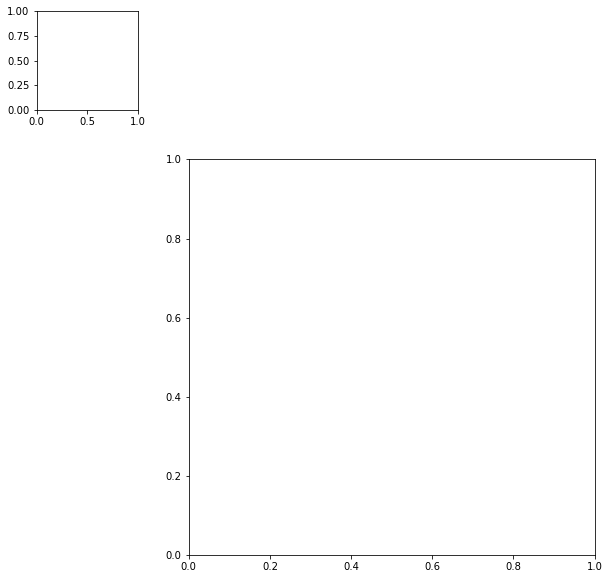

In [17]:
sns.clustermap(df, 
               annot = True,
               cmap = 'RdYlBu_r',
               vmin = -1, vmax = 1
              )

In [28]:
df1 = df.dropna(how='all', axis=0)
df2 = df1.dropna(how='all', axis=1)

In [29]:
df2

,height,weight,lower_body_size,mens_cramp,mens_cramps_intensity,PPA,bmi,diet_with_product,diet_no,diet_meal+exercise,diet_meal,diet_exercise,age,options_tension,options_stiffness,options_diarrhea,options_insomnia,options_abdominal_obesity,options_swelling,options_cold,exercise_type_walking,exercise_type_running,exercise_type_hiking,exercise_type_bicycle,exercise_type_golf,exercise_type_yoga_pilates,exercise_type_swimming,exercise_type_dance,exercise_type_fitness,thyroid_no,thyroid_hypothyroidism,thyroid_hyperthyroidism,thyroid_cancer,mens_disease_no,mens_disease_pms,mens_disease_fibroids,mens_disease_uterine_adenoma,mens_cramp_peak_before,mens_cramp_peak_first_day,mens_cramp_peak_second_day,mens_stress_peak_before,mens_stress_peak_first_day,mens_stressp_peak_second_day,mens_stress_peak_third_day,mens_cramp_part_belly,mens_cramp_part_pelvis,mens_cramp_part_waist,mens_cramp_part_below_thigh,mens_cramp_symptoms_swelling,mens_cramp_symptoms_emotion,mens_cramp_symptoms_belly_pain,mens_cramp_symptoms_constipation,mens_cramp_symptoms_lethargy,mens_cramp_symptoms_nervousness,mens_cramp_symptoms_indigestion,mens_cramp_symptoms_gas,mens_cramp_symptoms_diarrhea,mens_cramp_symptoms_digestive_upset,mens_cramp_symptoms_back_pain,mens_cramp_symptoms_chest_pain,mens_cramp_symptoms_increased_appetite,mens_cramp_symptoms_headache,mens_cramp_symptoms_depression,mens_cramp_symptoms_reduced_temperance,mens_cramp_symptoms_migraine,mens_cramp_symptoms_drowsiness,mens_cramp_symptoms_sensitive_temperature,mens_cramp_symptoms_colic,mens_cramp_symptoms_leg_numbness,mens_cramp_symptoms_leg_swelling,mens_cramp_symptoms_voracity,mens_cramp_symptoms_insomnia,mens_cramp_symptoms_anxiety,mens_cramp_symptoms_nausea,mens_cramp_symptoms_decreased_appetite,mens_cramp_symptoms_excessive_sleep,mens_cramp_symptoms_pimple,mens_cramp_symptoms_sickness,mens_cramp_symptoms_exhaustion,mens_cramp_symptoms_breathing_problem,mens_cramp_symptoms_dull_movement,mens_cramp_symptoms_gastrointestinal_disorder,mens_cramp_symptoms_muscle_pain,mens_cramp_symptoms_increased_libido,mens_cramp_symptoms_cold_sweat,mens_cramp_symptoms_dizziness,mens_cramp_symptoms_throw_up,mens_cramp_symptoms_abdominal_swelling,mens_cramp_symptoms_anemia,mens_cramp_symptoms_whirl,mens_cramp_symptoms_joint_pain,mens_cramp_symptoms_sweet,mens_cramp_symptoms_fever,mens_cramp_symptoms_chill,mens_cramp_symptoms_orthostatic_hypotension,mens_cramps_family_mother,mens_cramps_family_older_sister,mens_cramps_family_younger_sister,mens_cramps_family_relatives,mens_cramps_family_no,mens_symptoms_3_ovulation_cramps,mens_symptoms_3_long_cramps,mens_symptoms_3_abnormal,mens_symptoms_3_pressure,mens_symptoms_3_lump,mens_symptoms_3_abdominal_pain,mens_symptoms_3_gas,mens_symptoms_3_pelvis_pain,mens_symptoms_3_long_period,mens_symptoms_3_irregular_blood,mens_symptoms_3_waist_pain,mens_symptoms_3_stressful,mens_symptoms_3_cluster_blood,mens_symptoms_3_diarrhea,mens_symptoms_3_urination,mens_symptoms_3_irregular_blood_amount,mens_symptoms_3_intense_pain,mens_symptoms_3_stomachache,mens_before_after_pattern_toilet,mens_before_after_pattern_app,mens_before_after_pattern_embarrassment,mens_before_after_pattern_sex_nervousness,mens_before_after_pattern_sex_calculate_date,mens_before_after_pattern_sexual_desire,mens_before_after_pattern_accommodation,mens_before_after_pattern_keen,mens_before_after_pattern_cancellation,mens_before_after_pattern_work,mens_before_after_pattern_withstand,mens_before_after_pattern_urgent_cancellation,mens_before_after_pattern_sweet_spicy,mens_before_after_pattern_buy_comfy,mens_before_after_pattern_fancy,mens_before_after_pattern_partying,mens_before_after_pattern_comfy_clothes,mens_before_after_pattern_dark_clothes,mens_before_after_pattern_accessory,mens_before_after_pattern_heavy_makeup,mens_before_after_pattern_deceive,mens_before_after_pattern_help,mens_before_after_pattern_buy_pads,mens_before_after_pattern_borrow_pads,mens_before_after_pattern_bulk_purchase_pads,mens_before_after_pattern_exci